# Benchmark FUSE against STEP

In [15]:
using Revise
using FUSE
using Plots; gr();
using Printf
FUSE.logging(Logging.Info);

## Initialize with GASC v1 JSON file (FPPv1.0_aspectRatio3.5_PBpR35.json)

In [16]:
ini, act = FUSE.case_parameters(:FPP; version=:v1, init_from=:scalars);

### Modify select parameters to better match STEP solution

In [17]:
ini.equilibrium.R0 = 4.824
ini.equilibrium.ϵ = 1/3.5
ini.equilibrium.κ = 2.19
ini.equilibrium.δ = 0.7
ini.equilibrium.ζ = 0.0

ini.equilibrium.ip = 8.0e6
#ini.material.wall = "Tungsten"
#ini.material.shield = "Steel, Stainless 316"
ini.core_profiles.T_shaping = 2.0
ini.core_profiles.n_shaping = 2.0
ini.core_profiles.greenwald_fraction = 1.2
ini.core_profiles.greenwald_fraction_ped = missing
ini.core_profiles.ne_ped = 1.0e20
ini.core_profiles.impurity = :Kr
ini.core_profiles.zeff = 2.0
ini.core_profiles.T_ratio = 1.23

ini.pf_active.n_coils_outside = 8
ini.ec_launchers.power_launched[1] = 74e6
ini.nbi.power_launched = 0.1e6
ini.nbi.beam_energy = 10e3

#ini.build.n_first_wall_conformal_layers = 1

ini.equilibrium.boundary_from = :scalars
ini.equilibrium.xpoints_number = 2



#display(ini)

2

### Modify select actor settings to better match GASC solution

In [18]:
act.ActorEquilibrium.model = :CHEASE
act.ActorEquilibrium.symmetrize = true
act.ActorCHEASE.free_boundary = true
act.ActorCXbuild.rebuild_wall = true

act.ActorTauenn.T_shaping = 2.0
act.ActorTauenn.confinement_factor = 0.95

act.ActorCosting.model = :Sheffield

#display(act)

:Sheffield

### Run FUSE.init

In [19]:
dd = IMAS.dd()
@time FUSE.init(dd, ini, act; do_plot=false);


 41.205643 seconds (4.08 M allocations: 823.084 MiB, 0.60% gc time, 0.05% compilation time)


GEOMETRY                       EQUILIBRIUM                    TEMPERATURES                   DENSITIES                      
───────────────────────────    ───────────────────────────    ───────────────────────────    ───────────────────────────    
R0 → 4.82 [m]                  B0 → 4.71 [T]                  Te0 → 12.4 [keV]               ne0 → 2.01e+20 [m⁻³]           
a → 1.38 [m]                   ip → 8.01 [MA]                 Ti0 → 10.1 [keV]               ne_ped → 1e+20 [m⁻³]           
1/ϵ → 3.5 [m]                  q95 → 4.26                     <Te> → 5.61 [keV]              <ne> → 1.36e+20 [m⁻³]          
κ → 2.19                       βpol → 1.67                    <Ti> → 4.56 [keV]              ne0/<ne> → 1.47                
δ → 0.697                      βtor → 0.037                   Te0/<Te> → 2.21                fGW → 1.19                     
ζ → -0.00796                   βn → 3                         Ti0/<Ti> → 2.21                zeff_ped → 2                   


​


28×9 DataFrame
 Row │ group   details               type      ΔR         R_start   R_end     material      area       volume     
     │ String  String                String    Float64    Float64   Float64   String        Float64    Float64    
─────┼────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ in                                      1.19804     0.0       1.19804                15.6091      58.7487
   2 │ in                            oh        0.353714    1.19804   1.55176  ReBCO          4.60847     39.8114
   3 │ in                                      0.0696397   1.55176   1.6214                  0.907322     9.04487
   4 │ hfs                           tf        0.310622    1.6214    1.93202  ReBCO         11.4588     116.737
   5 │ hfs                                     0.0696397   1.93202   2.00166                29.9565    1614.41
   6 │ hfs     low temp              shield    0.428631    2.00166   2.43029 

​


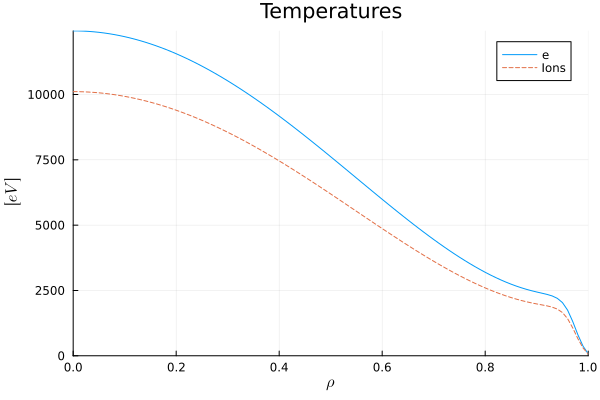

​


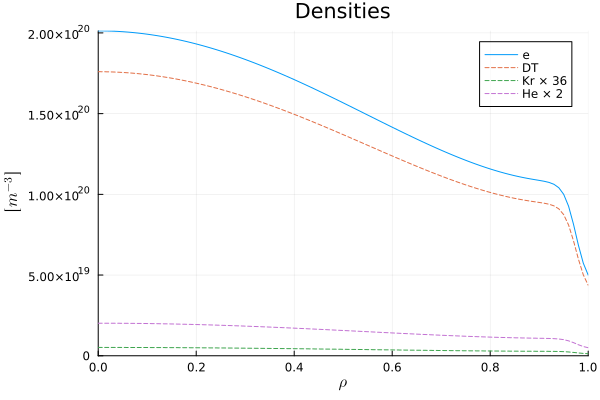

​


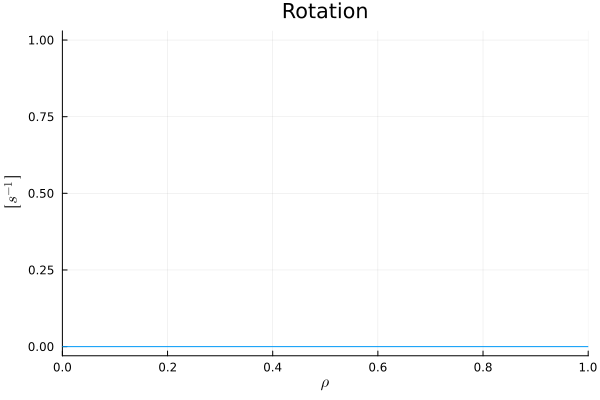

​


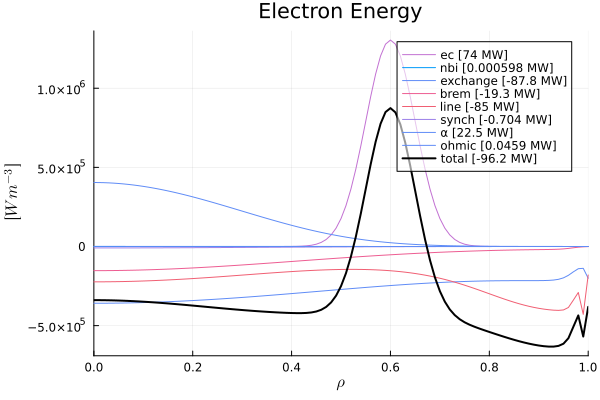

​


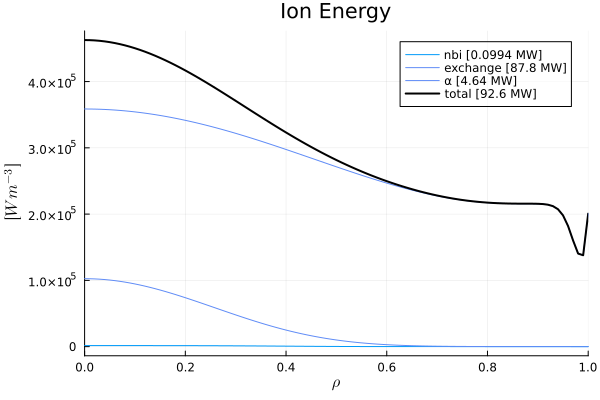

​


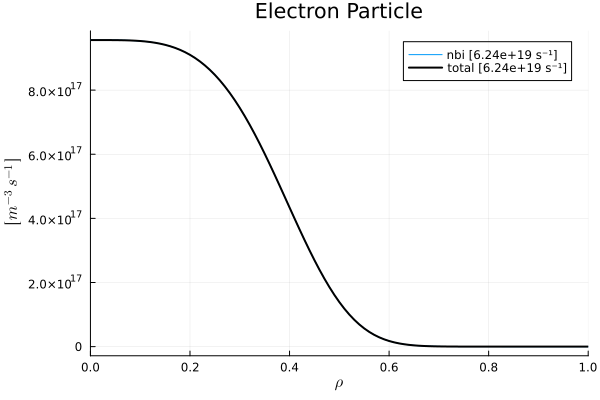

​


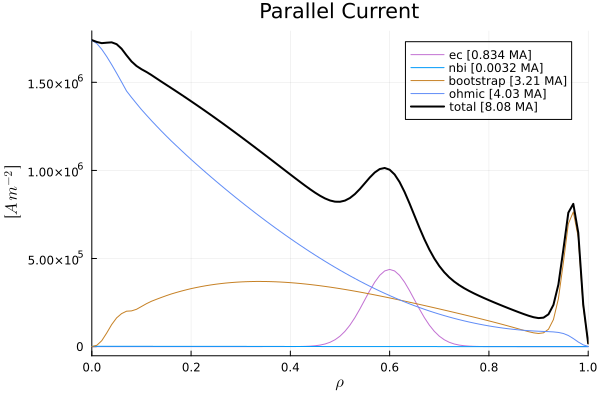

In [20]:
FUSE.digest(dd)

## Run EquilibriumTransport with Tauenn DS03 transport actor 

In [21]:
dd_tauenn = deepcopy(dd)

act.ActorTauenn.temp_pedestal_ratio = 1/1.23
@time FUSE.ActorEquilibriumTransport(dd_tauenn, act);

181.897128 seconds (12.73 M allocations: 1.061 GiB, 0.32% gc time, 0.07% compilation time)


GEOMETRY                       EQUILIBRIUM                    TEMPERATURES                   DENSITIES                      
───────────────────────────    ───────────────────────────    ───────────────────────────    ───────────────────────────    
R0 → 4.82 [m]                  B0 → 4.71 [T]                  Te0 → 25.6 [keV]               ne0 → 2.01e+20 [m⁻³]           
a → 1.38 [m]                   ip → 7.87 [MA]                 Ti0 → 20.8 [keV]               ne_ped → 1e+20 [m⁻³]           
1/ϵ → 3.5 [m]                  q95 → 5.61                     <Te> → 10.3 [keV]              <ne> → 1.36e+20 [m⁻³]          
κ → 2.19                       βpol → 2.74                    <Ti> → 8.37 [keV]              ne0/<ne> → 1.47                
δ → 0.697                      βtor → 0.0547                  Te0/<Te> → 2.48                fGW → 1.21                     
ζ → -0.00796                   βn → 4.55                      Ti0/<Ti> → 2.48                zeff_ped → 2                   


​


28×9 DataFrame
 Row │ group   details               type      ΔR         R_start   R_end     material      area       volume     
     │ String  String                String    Float64    Float64   Float64   String        Float64    Float64    
─────┼────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ in                                      1.19804     0.0       1.19804                15.6091      58.7487
   2 │ in                            oh        0.353714    1.19804   1.55176  ReBCO          4.60847     39.8114
   3 │ in                                      0.0696397   1.55176   1.6214                  0.907322     9.04487
   4 │ hfs                           tf        0.310622    1.6214    1.93202  ReBCO         11.4588     116.737
   5 │ hfs                                     0.0696397   1.93202   2.00166                29.9565    1614.41
   6 │ hfs     low temp              shield    0.428631    2.00166   2.43029 

​


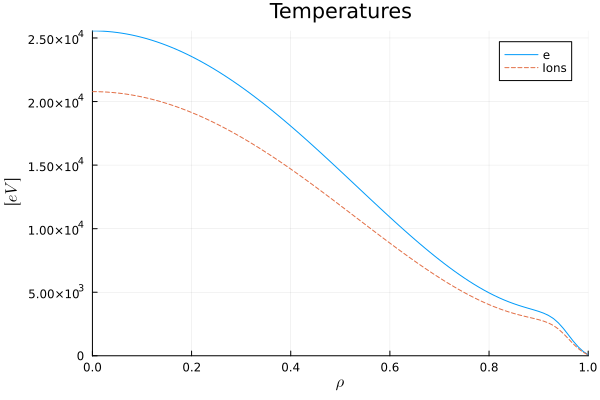

​


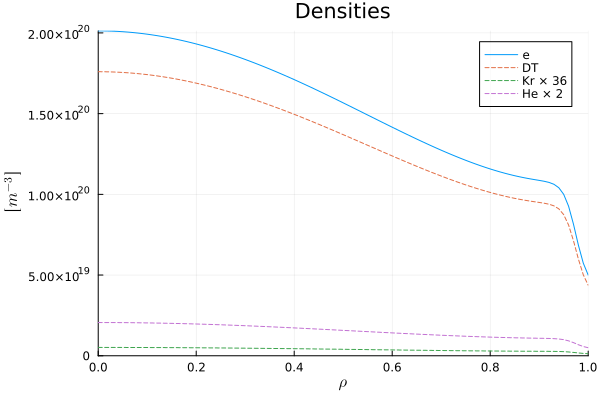

​


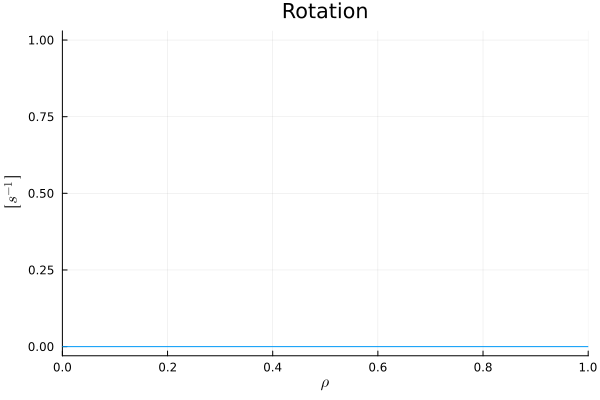

​


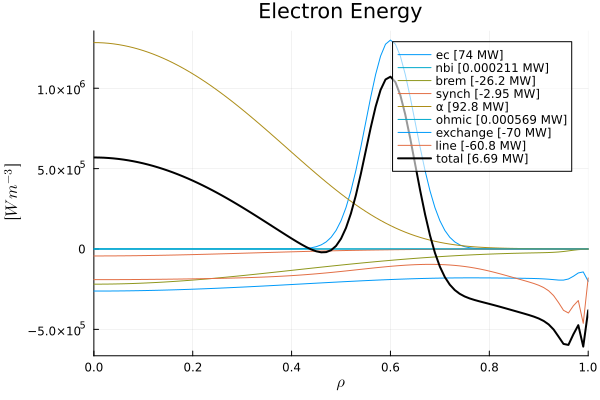

​


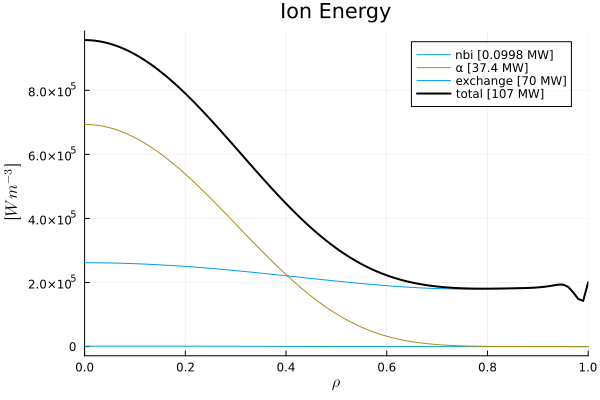

​


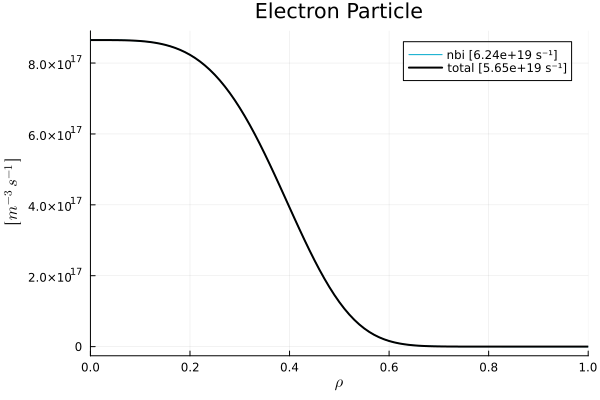

​


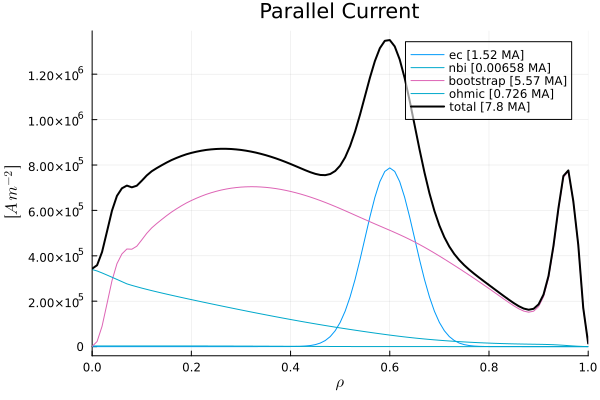

In [22]:
FUSE.digest(dd_tauenn)

## Run EquilibriumTransport with flux-matcher tglfnn actor

In [23]:
act.ActorTauenn.transport_model = :tglfnn
act.ActorTauenn.do_plot = false
act.ActorTauenn.verbose = false

act.ActorCoreTransport.model = :FluxMatcher
act.ActorFluxMatcher.evolve_densities = Dict(:electrons=>:flux_match,:DT=>:quasi_neutrality,:He=>:match_ne_scale,:He_fast=>:constant,:Kr=>:match_ne_scale)
act.ActorFluxMatcher.evolve_rotation = :fixed
act.ActorFluxMatcher.verbose = true
act.ActorFluxMatcher.do_plot = true
act.ActorFluxMatcher.step_size = 0.5

act.ActorTGLF.sat_rule = :sat0
act.ActorTGLF.electromagnetic = false
act.ActorTGLF.rho_transport = (0.2:0.1:0.9)
act.ActorFluxMatcher.rho_transport = (0.2:0.1:0.9)

display(act.ActorFluxMatcher.evolve_densities)

display(act.ActorEquilibriumTransport)
display(act.ActorCoreTransport)
display(act.ActorTauenn)
display(act.ActorTGLF)
display(act.ActorFluxMatcher)

Dict{Symbol, Symbol} with 5 entries:
  :DT        => :quasi_neutrality
  :He_fast   => :constant
  :Kr        => :match_ne_scale
  :He        => :match_ne_scale
  :electrons => :flux_match

ActorEquilibriumTransport{Float64}
├─ do_plot ➡ false Plot
├─ max_iter ➡ 5 max number of transport-equilibrium iterations
└─ convergence_error ➡ 0.01 Convergence error threshold (relative change in current and pressure profiles)


ActorCoreTransport{Float64}
└─ model ➡ :FluxMatcher Transport actor to run [:Tauenn, :FluxMatcher]


ActorTauenn{Float64}
├─ error ➡ 0.01 Target convergence error
├─ eped_factor ➡ 1.0 Scaling parameter for EPED-NN prediction
├─ rho_fluxmatch ➡ 0.6 Radial location where flux-macthing is done
├─ T_shaping ➡ 2.0 Shaping coefficient for the temperature profile
├─ temp_pedestal_ratio ➡ 0.8130081300813008 Ion to electron temperature ratio in the pedestal
├─ transport_model ➡ :tglfnn Transport model [:tglfnn, :tglf, :h98y2, :ds03]
├─ warn_nn_train_bounds ➡ false Warn if EPED-NN / TGLF-NN training bounds are exceeded
├─ update_pedestal ➡ true update pedestal with eped_nn inside TAUENN
├─ confinement_factor ➡ 0.95 Confinement multiplier
├─ do_plot ➡ false Plot
└─ verbose ➡ false Verbose


ActorTGLF{Float64}
├─ nn ➡ true Use TGLF-NN
├─ sat_rule ➡ :sat0 Saturation rule [:sat0, :sat0quench, :sat1, :sat1geo, :sat2]
├─ electromagnetic ➡ false Electromagnetic or electrostatic
├─ rho_transport ➡ 0.2:0.1:0.9 rho_tor_norm values to compute tglf fluxes on
└─ warn_nn_train_bounds ➡ false Raise warnings if querying cases that are certainly outside of the training range


ActorFluxMatcher{Float64}
├─ evolve_Ti ➡ :flux_match Evolve ion temperature  [:flux_match, :fixed]
├─ evolve_Te ➡ :flux_match Evolve electron temperature [:flux_match, :fixed]
├─ evolve_densities ➡ Dict{Symbol, Symbol}(
│                     :DT => :quasi_neutrality
│                     :He_fast => :constant
│                     :Kr => :match_ne_scale
│                     :He => :match_ne_scale
│                     :electrons => :flux_match) Dict to specify which ion species are evolved, kept constant, or used to
│  enforce quasi neutarlity
├─ evolve_rotation ➡ :fixed Evolve the electron temperature [:flux_match, :fixed]
├─ rho_transport ➡ 0.2:0.1:0.9 Rho transport grid
├─ evolve_pedestal ➡ true Evolve the pedestal inside the transport solver
├─ max_iterations ➡ 200 Maximum optimizer iterations
├─ optimizer_algorithm ➡ :anderson Optimizing algorithm used for the flux matching [:anderson, :jacobian_based]
├─ step_size ➡ 0.5 Step size for each algorithm iteration (note this has a dif

### Add function for pellet fueling

In [24]:
function add_pellet_source(dd,electrons_particles,rho_0,width)
    eqt = dd.equilibrium.time_slice[]
    cp1d = dd.core_profiles.profiles_1d[]
    cs = dd.core_sources
    isource = resize!(cs.source, "identifier.name" => "arb pellet")
    rho_cp = cp1d.grid.rho_tor_norm
    volume_cp = IMAS.interp1d(eqt.profiles_1d.rho_tor_norm, eqt.profiles_1d.volume).(rho_cp)
    area_cp = IMAS.interp1d(eqt.profiles_1d.rho_tor_norm, eqt.profiles_1d.area).(rho_cp)
    power_launched = 0.0
    gauss_order=1.0

    return FUSE.gaussian_source(
        isource,
        "arb pellet",
        901,
        rho_cp,
        volume_cp,
        area_cp,
        power_launched,
        ones(length(rho_cp)),
        rho_0,
        width,
        gauss_order;
        electrons_particles,
        momentum_tor=missing,
        j_parallel=missing
    )
end

add_pellet_source (generic function with 1 method)

### Step through each EquilibriumTransport iteration to follow core evolution

#### 1st step

Iter     f(x) inf-norm    Step 2-norm 
------   --------------   --------------
     1     8.301196e+00              NaN
     2     8.109457e+00     1.672058e+02
     3     7.750971e+00     1.623226e+02
     4     7.249858e+00     1.561464e+02
     5     6.915420e+00     1.525698e+02
     6     6.895099e+00     1.522988e+02
     7     6.937910e+00     1.504984e+02
     8     6.970993e+00     1.470870e+02
     9     6.996764e+00     1.454461e+02
    10     7.060941e+00     1.475306e+02
    11     7.134792e+00     1.489851e+02
    12     7.183066e+00     1.509597e+02
    13     7.212695e+00     1.524903e+02
    14     7.230708e+00     1.531863e+02
    15     7.239040e+00     1.531891e+02
    16     7.236274e+00     1.526761e+02
    17     7.225341e+00     1.519237e+02
    18     7.214678e+00     1.511033e+02
    19     7.242686e+00     1.502281e+02
    20     7.266466e+00     1.492791e+02
    21     7.286245e+00     1.482331e+02
    22     7.299800e+00     1.471827e+02
    23     7.30559

Results of Nonlinear Solver Algorithm
 * Algorithm: Anderson m=0 beta=-0.5 aa_start=1 droptol=1.0e10
 * Starting Point: [-125.4916063192378, -196.52088867985947, -278.46488904833404, -376.0210401477238, -491.4467654735805, -608.108994944763, -618.3716992155818, -549.3946528161911, -125.49160631923728, -196.52088867985913, -278.4648890483362, -376.0210401477271, -491.44676547358125, -608.1089949447614, -618.3716992155821, -549.394652816195, -61.461813324136315, -91.39354378047086, -119.48725531932158, -143.32023964815716, -158.21804913090247, -156.04981043505077, -124.8852329858315, -70.58209639950988]
 * Zero: [-56.53509401173661, -73.16961507570988, -79.35961074812296, -115.12277681163195, -222.36922662215, -321.0198416095746, -406.0807041317638, -729.8538427190069, -0.4355126423815638, -11.564365926427048, -15.17750884400451, -95.1764847068384, -233.05956385958166, -360.07923017934587, -521.3145697434111, -734.4053280768451, -11.073886469841478, -15.053000357459483, -30.9005465913403

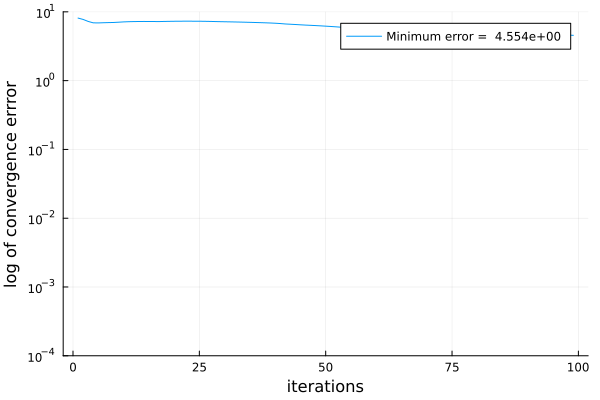

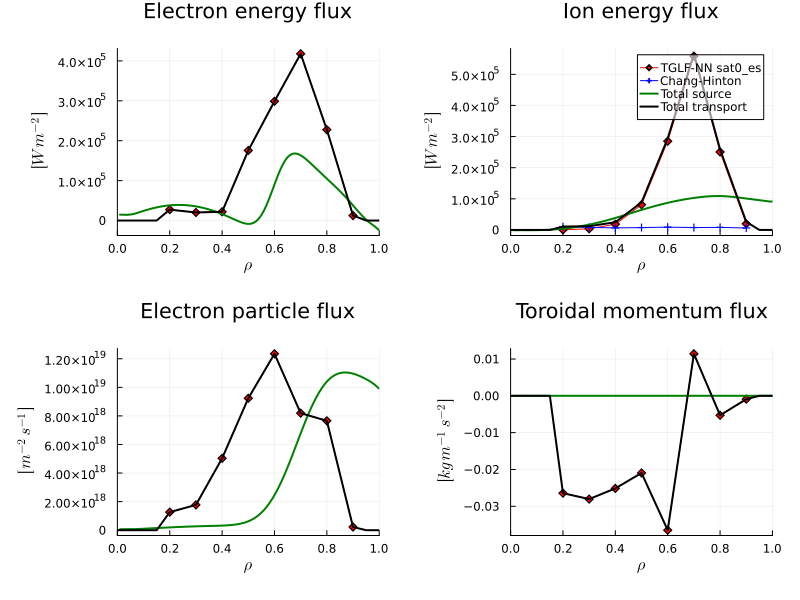

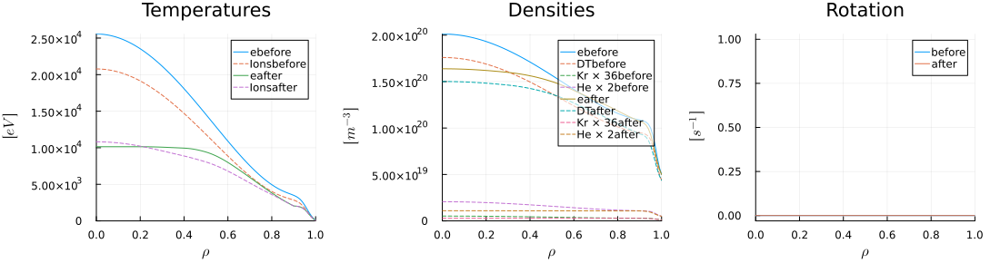

[ Info: Iteration = 1 , convergence error = 0.312, threshold = 0.01
┌ Warning: Max number of iterations (1) has been reached with convergence error of 0.312 compared to threshold of 0.01
└ @ FUSE ~/.julia/dev/FUSE/src/actors/compound/equilibrium_transport_actor.jl:105


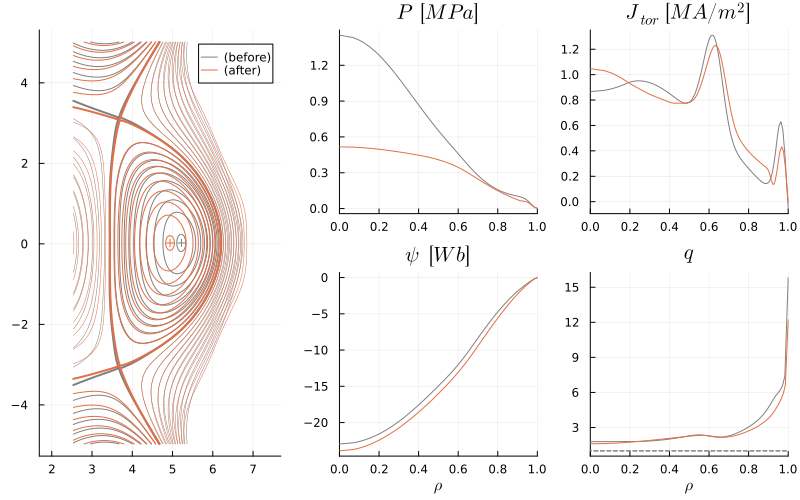

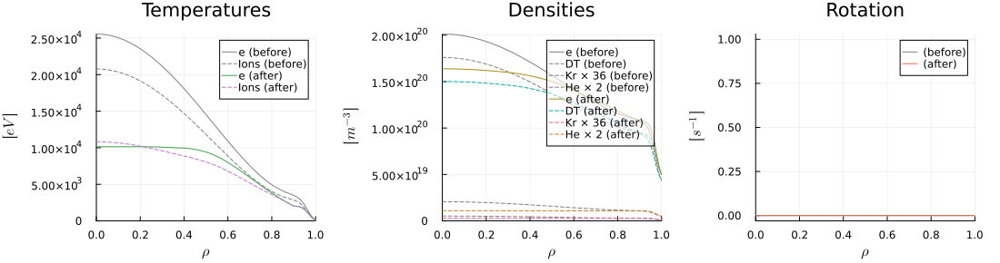

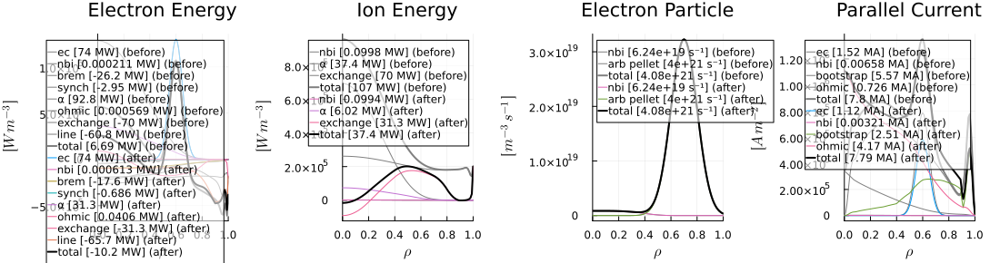

127.499132 seconds (38.46 M allocations: 3.415 GiB, 2.86% gc time)
noninductive current = 3.92 MA
bootstrap current = 2.81 MA
aux current = 1.11 MA
ohmic current = 4.17 MA


In [25]:
# initialize from tauenn solution
dd_fluxmatcher = deepcopy(dd_tauenn);

# add particle source
add_pellet_source(dd_fluxmatcher,4e21,0.7,0.1)
#plot(dd_fluxmatcher.core_sources.source[10].profiles_1d[1].electrons.particles)

act.ActorEquilibriumTransport.do_plot = true
act.ActorEquilibriumTransport.max_iter = 1
act.ActorFluxMatcher.max_iterations = 100
act.ActorFluxMatcher.optimizer_algorithm = :anderson

#run
@time FUSE.ActorEquilibriumTransport(dd_fluxmatcher, act);

i_ni = dd_fluxmatcher.summary.global_quantities.current_non_inductive.value[1]
i_bs = dd_fluxmatcher.summary.global_quantities.current_bootstrap.value[1]
i_ohm = dd_fluxmatcher.summary.global_quantities.current_ohm.value[1]
i_aux = i_ni-i_bs

@printf("noninductive current = %.2f MA\n",i_ni/1e6)
@printf("bootstrap current = %.2f MA\n",i_bs/1e6)
@printf("aux current = %.2f MA\n", i_aux/1e6)
@printf("ohmic current = %.2f MA\n", i_ohm/1e6)

#### 2nd step

Iter     f(x) inf-norm    Step 2-norm 
------   --------------   --------------
     1     6.522004e+00              NaN
     2     6.486741e+00     1.136299e+02
     3     6.456787e+00     1.118392e+02
     4     6.423764e+00     1.090912e+02
     5     6.387492e+00     1.060328e+02
     6     6.365099e+00     1.024204e+02
     7     6.348846e+00     9.933634e+01
     8     6.330155e+00     9.748215e+01
     9     6.308843e+00     9.514031e+01
    10     6.284789e+00     9.244732e+01
    11     6.257970e+00     8.932323e+01
    12     6.228509e+00     8.546237e+01
    13     6.196780e+00     8.398714e+01
    14     6.163273e+00     8.209443e+01
    15     6.128117e+00     8.024228e+01
    16     6.091191e+00     7.833112e+01
    17     6.053178e+00     7.627784e+01
    18     6.014239e+00     7.408758e+01
    19     5.974687e+00     7.180783e+01
    20     5.934818e+00     6.967183e+01
    21     5.894960e+00     6.798853e+01
    22     5.855234e+00     6.635486e+01
    23     5.81568

Results of Nonlinear Solver Algorithm
 * Algorithm: Anderson m=0 beta=-0.5 aa_start=1 droptol=1.0e10
 * Starting Point: [-84.80888265235849, -109.75856150104556, -119.04795039924454, -172.7272042661608, -333.66788346262695, -481.6769354368173, -609.5439217558604, -631.7408732028268, -0.6533081150558222, -17.346951342059988, -22.770808208407185, -142.81904718317517, -349.7429538953914, -540.3787754919458, -782.4586787317764, -634.5471505445132, -16.61108997964266, -22.580296657727885, -46.353599639543674, -76.0103726359558, -120.3620895555683, -117.74777397861953, -155.36967397320794, -114.23559166489596]
 * Zero: [-82.5495666497149, -80.61962903431632, -86.5151407782035, -92.60613272898456, -140.67942620006636, -230.82462585060478, -381.1768332211909, -762.7929738712644, -63.445514441957116, -54.18753841835156, -31.548811770179327, 11.676505564818282, -142.60462482340296, -298.4900270471884, -550.6485690831274, -649.6296106515624, -38.47263403217903, -38.62212004385602, -35.58530674332

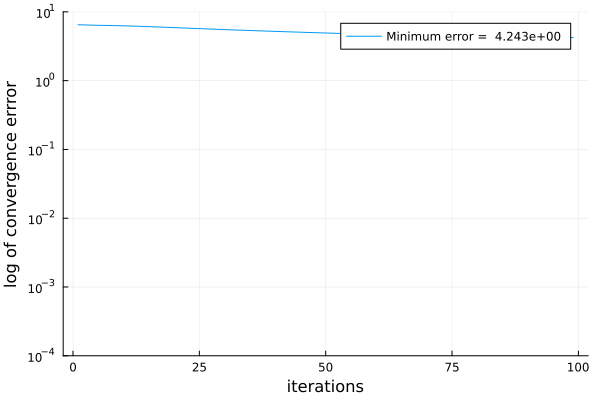

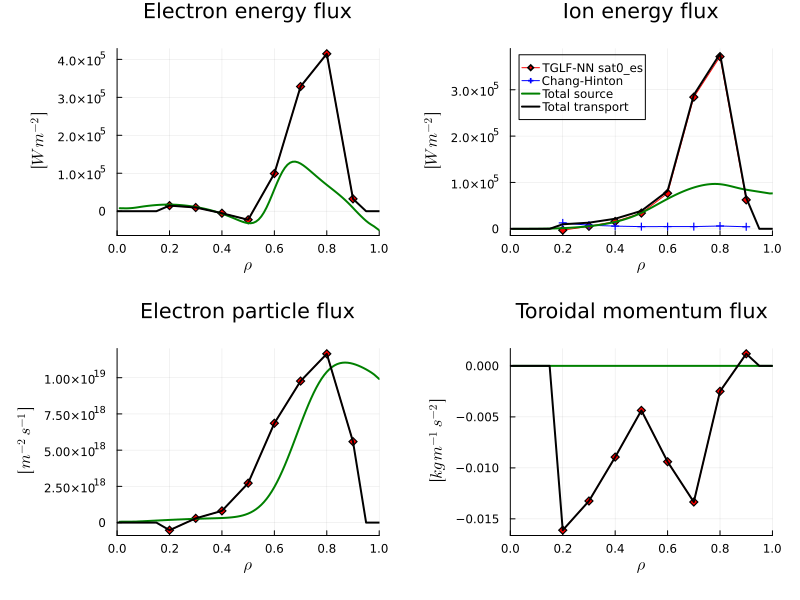

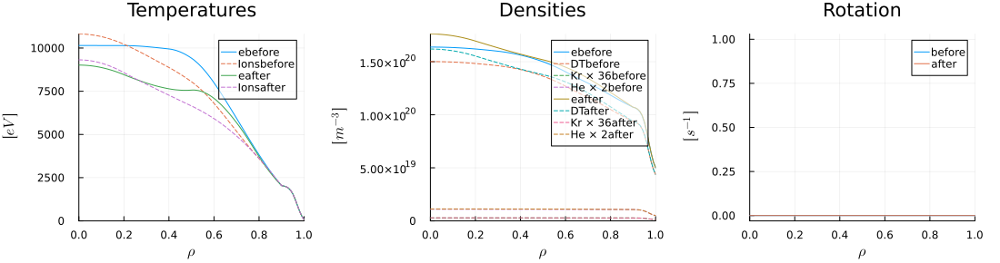

[ Info: Iteration = 1 , convergence error = 0.106, threshold = 0.01
┌ Warning: Max number of iterations (1) has been reached with convergence error of 0.106 compared to threshold of 0.01
└ @ FUSE ~/.julia/dev/FUSE/src/actors/compound/equilibrium_transport_actor.jl:105


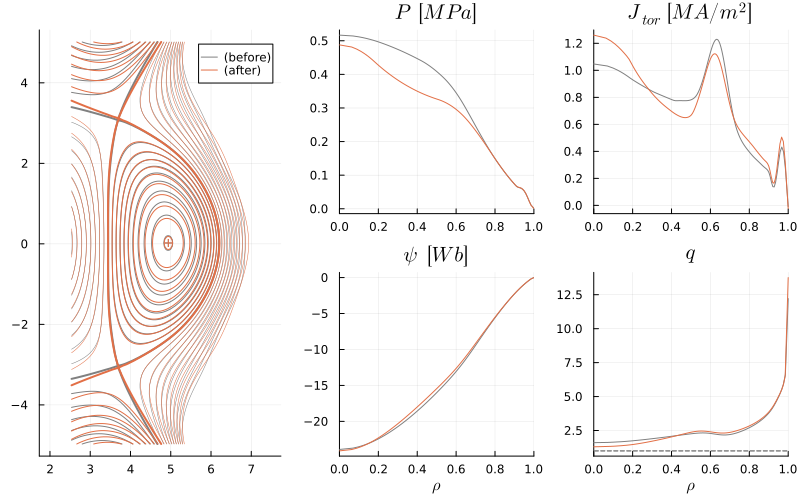

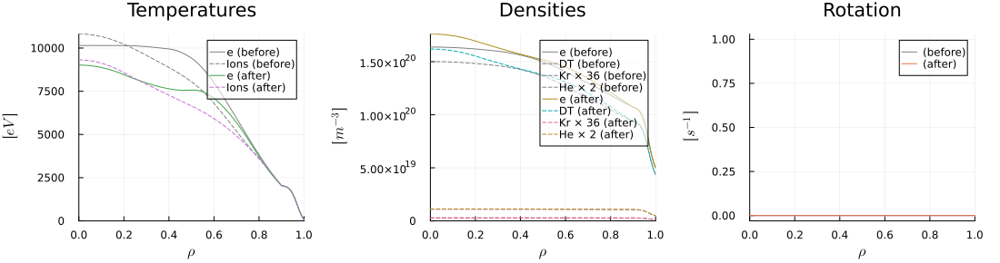

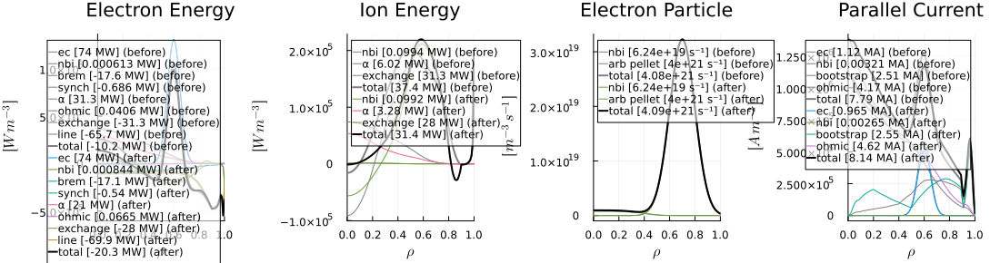

130.556325 seconds (41.30 M allocations: 4.023 GiB, 2.34% gc time)
noninductive current = 3.54 MA
bootstrap current = 2.57 MA
aux current = 0.97 MA
ohmic current = 4.62 MA


In [26]:
@time FUSE.ActorEquilibriumTransport(dd_fluxmatcher, act);

i_ni = dd_fluxmatcher.summary.global_quantities.current_non_inductive.value[1]
i_bs = dd_fluxmatcher.summary.global_quantities.current_bootstrap.value[1]
i_ohm = dd_fluxmatcher.summary.global_quantities.current_ohm.value[1]
i_aux = i_ni-i_bs

@printf("noninductive current = %.2f MA\n",i_ni/1e6)
@printf("bootstrap current = %.2f MA\n",i_bs/1e6)
@printf("aux current = %.2f MA\n", i_aux/1e6)
@printf("ohmic current = %.2f MA\n", i_ohm/1e6)

#### 3rd step

Iter     f(x) inf-norm    Step 2-norm 
------   --------------   --------------
     1     5.669031e+00              NaN
     2     5.633852e+00     7.888120e+01
     3     5.599265e+00     7.410118e+01
     4     5.565733e+00     7.067234e+01
     5     5.533609e+00     6.728297e+01
     6     5.502330e+00     6.373299e+01
     7     5.471718e+00     6.010247e+01
     8     5.441799e+00     5.647619e+01
     9     5.412591e+00     5.305502e+01
    10     5.384043e+00     5.007493e+01
    11     5.355905e+00     4.740788e+01
    12     5.327741e+00     4.514329e+01
    13     5.299399e+00     4.319487e+01
    14     5.271068e+00     4.144155e+01
    15     5.242903e+00     3.986209e+01
    16     5.214973e+00     3.847006e+01
    17     5.187289e+00     3.732159e+01
    18     5.159833e+00     3.642608e+01
    19     5.132587e+00     3.564373e+01
    20     5.105521e+00     3.491917e+01
    21     5.078610e+00     3.426297e+01
    22     5.051837e+00     3.368082e+01
    23     5.02520

Results of Nonlinear Solver Algorithm
 * Algorithm: Anderson m=0 beta=-0.5 aa_start=1 droptol=1.0e10
 * Starting Point: [-123.83218130265192, -120.93023476615386, -129.77530366803222, -138.92211884576338, -211.06871350950618, -346.37768068744333, -572.2863719716402, -651.9280691411839, -95.17168045821342, -81.27708897368704, -47.31831932333077, 17.51325619874998, -214.01734347932242, -448.0446382554967, -826.4567908830657, -562.5047125290264, -57.71074309095736, -57.932904628996624, -53.37751019237284, -50.37494102498272, -89.63867247439231, -137.15355372898802, -173.17855543106688, -134.22306940988193]
 * Zero: [-103.99944112257252, -102.53626238081236, -103.29896866517369, -102.93017397628334, -139.9217449045181, -157.6190280110703, -365.7203311029327, -755.3532969352894, -102.69287464820836, -98.28212834091707, -65.11658422244358, 5.288737265570886, -109.43750992742427, -233.2223179960651, -599.6991386973255, -502.282472298673, -48.22209443568227, -46.750541535339494, -40.6876316923

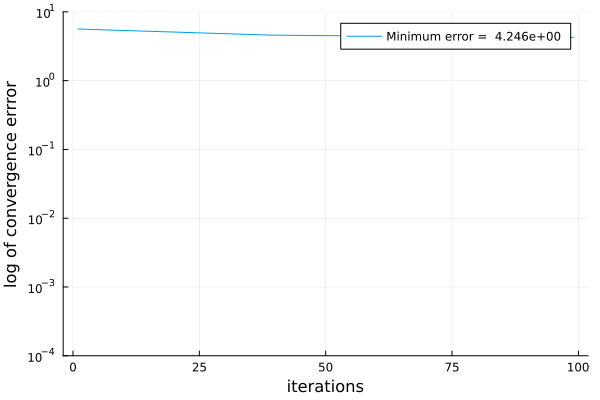

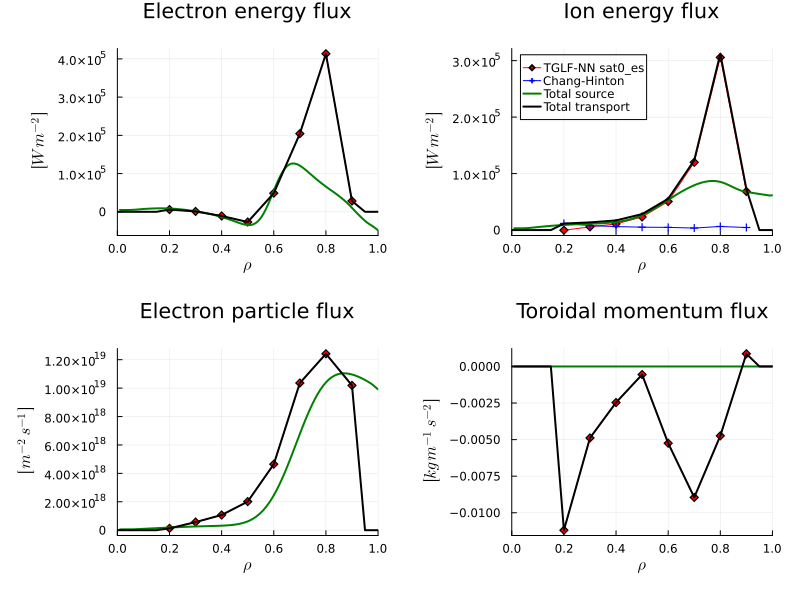

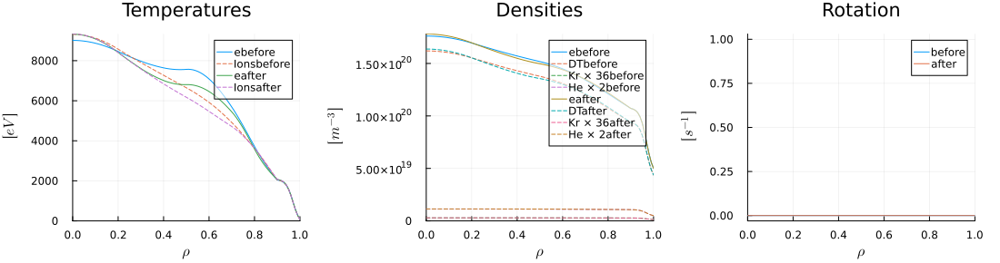

[ Info: Iteration = 1 , convergence error = 0.073, threshold = 0.01
┌ Warning: Max number of iterations (1) has been reached with convergence error of 0.073 compared to threshold of 0.01
└ @ FUSE ~/.julia/dev/FUSE/src/actors/compound/equilibrium_transport_actor.jl:105


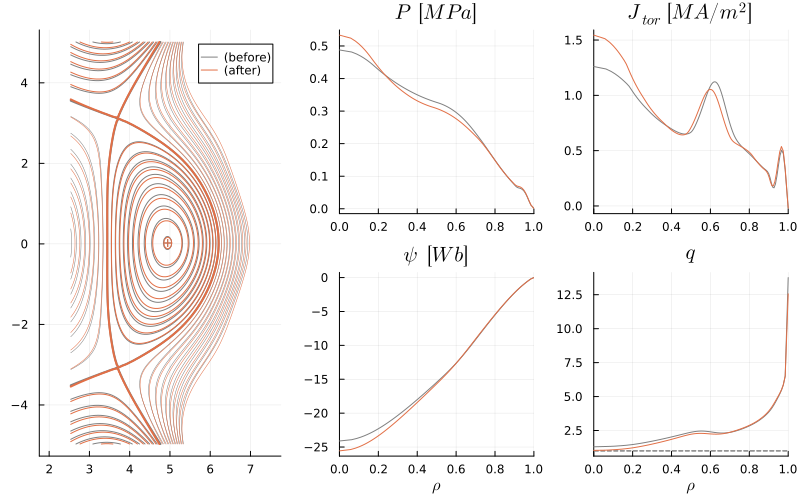

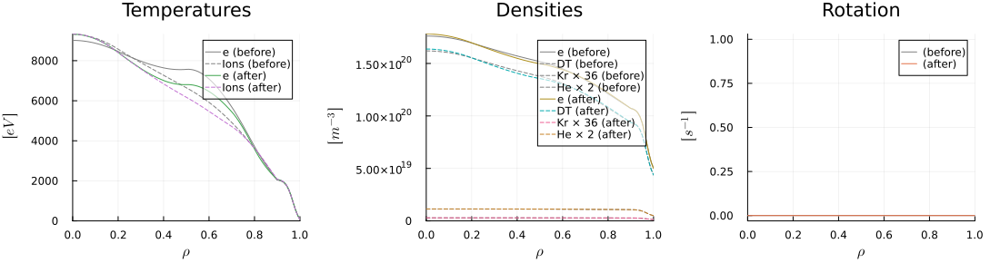

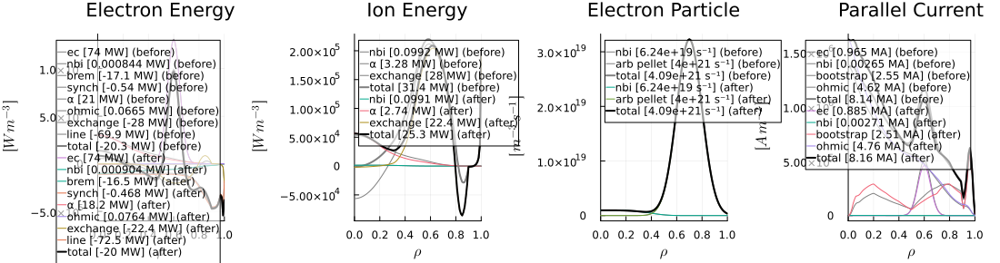

132.637926 seconds (44.21 M allocations: 4.511 GiB, 1.82% gc time)
noninductive current = 3.42 MA
bootstrap current = 2.54 MA
aux current = 0.88 MA
ohmic current = 4.76 MA


In [27]:
@time FUSE.ActorEquilibriumTransport(dd_fluxmatcher, act);

i_ni = dd_fluxmatcher.summary.global_quantities.current_non_inductive.value[1]
i_bs = dd_fluxmatcher.summary.global_quantities.current_bootstrap.value[1]
i_ohm = dd_fluxmatcher.summary.global_quantities.current_ohm.value[1]
i_aux = i_ni-i_bs

@printf("noninductive current = %.2f MA\n",i_ni/1e6)
@printf("bootstrap current = %.2f MA\n",i_bs/1e6)
@printf("aux current = %.2f MA\n", i_aux/1e6)
@printf("ohmic current = %.2f MA\n", i_ohm/1e6)

GEOMETRY                       EQUILIBRIUM                    TEMPERATURES                   DENSITIES                      
───────────────────────────    ───────────────────────────    ───────────────────────────    ───────────────────────────    
R0 → 4.82 [m]                  B0 → 4.71 [T]                  Te0 → 9.32 [keV]               ne0 → 1.78e+20 [m⁻³]           
a → 1.38 [m]                   ip → 7.94 [MA]                 Ti0 → 9.33 [keV]               ne_ped → 1e+20 [m⁻³]           
1/ϵ → 3.5 [m]                  q95 → 4.72                     <Te> → 5.09 [keV]              <ne> → 1.33e+20 [m⁻³]          
κ → 2.19                       βpol → 1.23                    <Ti> → 4.78 [keV]              ne0/<ne> → 1.34                
δ → 0.697                      βtor → 0.0256                  Te0/<Te> → 1.83                fGW → 1.12                     
ζ → -0.00796                   βn → 2.1                       Ti0/<Ti> → 1.95                zeff_ped → 2                   


​


28×9 DataFrame
 Row │ group   details               type      ΔR         R_start   R_end     material      area       volume     
     │ String  String                String    Float64    Float64   Float64   String        Float64    Float64    
─────┼────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ in                                      1.19804     0.0       1.19804                15.6091      58.7487
   2 │ in                            oh        0.353714    1.19804   1.55176  ReBCO          4.60847     39.8114
   3 │ in                                      0.0696397   1.55176   1.6214                  0.907322     9.04487
   4 │ hfs                           tf        0.310622    1.6214    1.93202  ReBCO         11.4588     116.737
   5 │ hfs                                     0.0696397   1.93202   2.00166                29.9565    1614.41
   6 │ hfs     low temp              shield    0.428631    2.00166   2.43029 

​


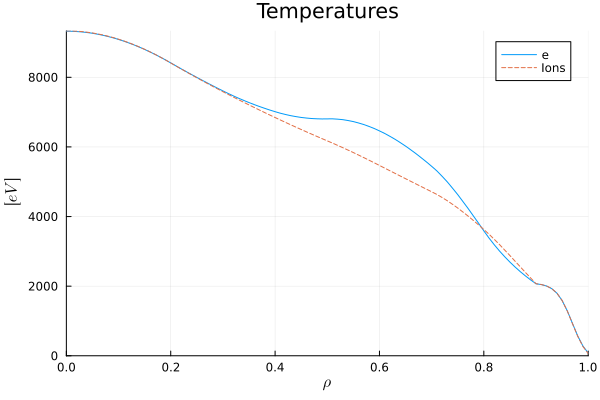

​


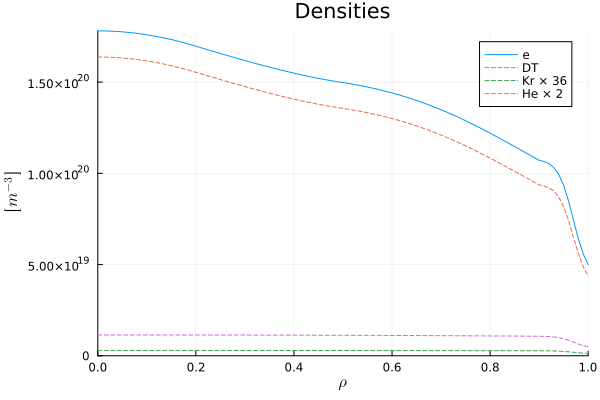

​


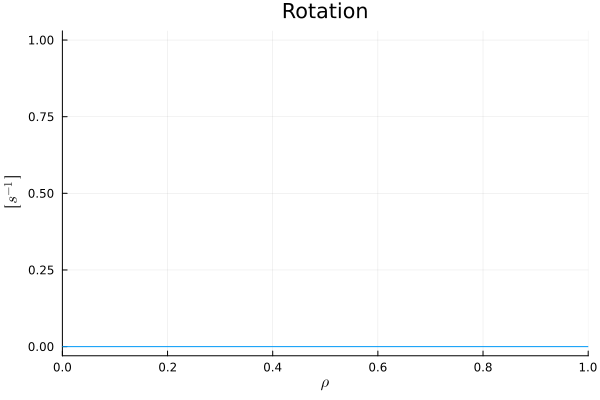

​


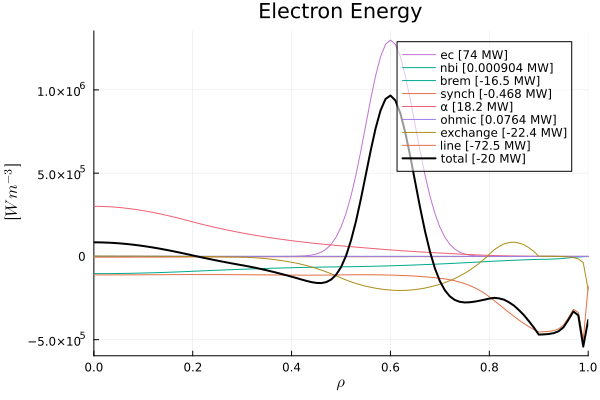

​


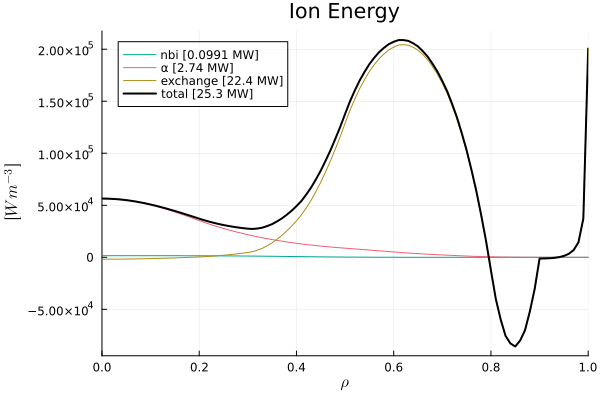

​


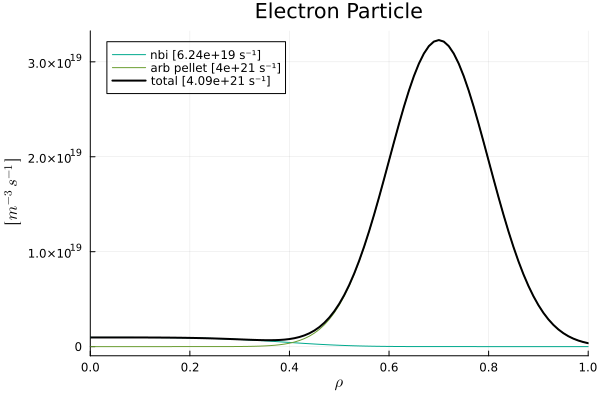

​


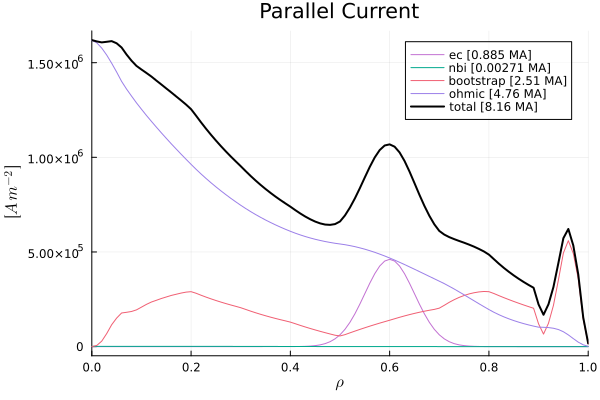

In [28]:
FUSE.digest(dd_fluxmatcher)